Hello :D 

**edit the data_dir and out_dir for you're specific PC.**

**data_dir is where the data is stored**

**out_dit is where to save the trained model and images.** 

In [1]:
# -*- coding: utf-8 -*-
### RUN IN PYTHON 3
import os
import cv2
import csv
import glob
import click
import logging
import numpy as np
import pandas as pd

from PIL import Image 
from tqdm import tqdm
from dotenv import find_dotenv, load_dotenv
from sklearn import preprocessing
from sklearn.decomposition import PCA

from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.spatial.transform import Rotation as R
from scipy.ndimage.interpolation import map_coordinates

data_dir = '/home/user/Robotics/Data_sets/slip_detection/will_dataset/data_collection_200/data_collection_001/'
out_dir = '/home/user/Robotics/Data_sets/slip_detection/manual_slip_detection/'
SAVE_IMAGES= True
sequence_length = 20
image_height, image_width = 32, 32
save_deriv1 = True
save_deriv2 = True

In [2]:
## Load the data:
files = glob.glob(data_dir + '/*')
path_file = []
index_to_save = 0

xela_sensor1_data_x_final, xela_sensor1_data_y_final, xela_sensor1_data_z_final = [], [], []
xela_sensor1_data_x_final_1stderiv = []
xela_sensor1_data_y_final_1stderiv = []
xela_sensor1_data_z_final_1stderiv = []
xela_sensor1_data_x_final_2stderiv = []
xela_sensor1_data_y_final_2stderiv = []
xela_sensor1_data_z_final_2stderiv = []


ee_positions_final = []
ee_position_x_final = []
ee_position_y_final = []
ee_position_z_final = []
ee_orientation_quat_x_final = []
ee_orientation_quat_y_final = []
ee_orientation_quat_z_final = []
ee_orientation_quat_w_final = []
ee_orientation_x_final = []
ee_orientation_y_final = []
ee_orientation_z_final = []

exp_break_points = []
exp_break_point = 0
cut = 0
for experiment_number in tqdm(range(len(files))):
    meta_data = np.asarray(pd.read_csv(files[experiment_number] + '/meta_data.csv', header=None))
    robot_state  = np.asarray(pd.read_csv(files[experiment_number] + '/robot_state.csv', header=None))
    proximity    = np.asarray(pd.read_csv(files[experiment_number] + '/proximity.csv', header=None))
    xela_sensor1 = np.asarray(pd.read_csv(files[experiment_number] + '/xela_sensor1.csv', header=None))
    xela_sensor2 = np.asarray(pd.read_csv(files[experiment_number] + '/xela_sensor2.csv', header=None))
    
    ee_positions = []
    ee_position_x, ee_position_y, ee_position_z = [], [], []
    ee_orientation_x, ee_orientation_y, ee_orientation_z = [], [], []
    ee_orientation_quat_x, ee_orientation_quat_y, ee_orientation_quat_z, ee_orientation_quat_w = [], [], [], []

    xela_sensor1_data_x, xela_sensor1_data_y, xela_sensor1_data_z = [], [], []
    xela_sensor2_data_x, xela_sensor2_data_y, xela_sensor2_data_z = [], [], []
    xela_sensor1_data_x_mean, xela_sensor1_data_y_mean, xela_sensor1_data_z_mean = [], [], []
    xela_sensor2_data_x_mean, xela_sensor2_data_y_mean, xela_sensor2_data_z_mean = [], [], []
    
    ####################################### Robot Data ###########################################
    for state in robot_state[1:]:
        ee_positions.append([float(item) for item in robot_state[1][-7:-4]])
        ee_position_x.append(state[-7])
        ee_position_y.append(state[-6])
        ee_position_z.append(state[-5])
        # quat
        ee_orientation_quat_x.append(state[-4])
        ee_orientation_quat_y.append(state[-3])
        ee_orientation_quat_z.append(state[-2])
        ee_orientation_quat_w.append(state[-1])
        # euler
        ee_orientation = R.from_quat([state[-4], state[-3], state[-2], state[-1]]).as_euler('zyx', degrees=True)
        ee_orientation_x.append(ee_orientation[0])
        ee_orientation_y.append(ee_orientation[1])
        ee_orientation_z.append(ee_orientation[2])
        exp_break_point += 1

    # fix the euler angles:
    for i in range(len(ee_orientation_z)):
        if ee_orientation_z[i] < 0:
            ee_orientation_z[i] += 360

    ####################################### Xela Data ###########################################
    for sample1, sample2 in zip(xela_sensor1[1:], xela_sensor2[1:]):
        sample1_data_x, sample1_data_y, sample1_data_z = [], [], []
        sample2_data_x, sample2_data_y, sample2_data_z = [], [], []
        for i in range(0, len(xela_sensor1[0]), 3):
            sample1_data_x.append(float(sample1[i]))
            sample1_data_y.append(float(sample1[i+1]))
            sample1_data_z.append(float(sample1[i+2]))
        xela_sensor1_data_x.append(sample1_data_x)
        xela_sensor1_data_y.append(sample1_data_y)
        xela_sensor1_data_z.append(sample1_data_z)

    # mean starting values:
    xela_sensor1_average_starting_value_x = int(sum(xela_sensor1_data_x[0]) / len(xela_sensor1_data_x[0]))
    xela_sensor1_average_starting_value_y = int(sum(xela_sensor1_data_y[0]) / len(xela_sensor1_data_y[0]))
    xela_sensor1_average_starting_value_z = int(sum(xela_sensor1_data_z[0]) / len(xela_sensor1_data_z[0]))
    xela_sensor1_offset_x = [xela_sensor1_average_starting_value_x - tactile_starting_value for tactile_starting_value in xela_sensor1_data_x[0]]
    xela_sensor1_offset_y = [xela_sensor1_average_starting_value_y - tactile_starting_value for tactile_starting_value in xela_sensor1_data_y[0]]
    xela_sensor1_offset_z = [xela_sensor1_average_starting_value_z - tactile_starting_value for tactile_starting_value in xela_sensor1_data_z[0]]
    
    for time_step in range(len(xela_sensor1_data_x)):
        xela_sensor1_sample_x_test = [offset+real_value for offset, real_value in zip(xela_sensor1_offset_x, xela_sensor1_data_x[time_step])]
        xela_sensor1_sample_y_test = [offset+real_value for offset, real_value in zip(xela_sensor1_offset_y, xela_sensor1_data_y[time_step])]
        xela_sensor1_sample_z_test = [offset+real_value for offset, real_value in zip(xela_sensor1_offset_z, xela_sensor1_data_z[time_step])]
        for i in range(np.asarray(xela_sensor1_data_x).shape[1]):
            xela_sensor1_data_x[time_step][i] = xela_sensor1_sample_x_test[i]
            xela_sensor1_data_y[time_step][i] = xela_sensor1_sample_y_test[i] 
            xela_sensor1_data_z[time_step][i] = xela_sensor1_sample_z_test[i]
    
    # calculate the derivatives
    if save_deriv1 == True:
        cut = 1
        xela_deriv1_x = np.diff(np.array(xela_sensor1_data_x), axis=0).tolist()
        xela_deriv1_y = np.diff(np.array(xela_sensor1_data_y), axis=0).tolist()
        xela_deriv1_z = np.diff(np.array(xela_sensor1_data_z), axis=0).tolist()
        # store the data:
        xela_sensor1_data_x_final_1stderiv += xela_deriv1_x 
        xela_sensor1_data_y_final_1stderiv += xela_deriv1_y 
        xela_sensor1_data_z_final_1stderiv += xela_deriv1_z 
        
    if save_deriv2 == True:
        cut = 2
        xela1_deriv2_x = np.diff(np.array(xela_sensor1_data_x), axis=0, n=2).tolist()
        xela1_deriv2_y = np.diff(np.array(xela_sensor1_data_y), axis=0, n=2).tolist()
        xela1_deriv2_z = np.diff(np.array(xela_sensor1_data_z), axis=0, n=2).tolist()
        # store the data:
        xela_sensor1_data_x_final_2stderiv += xela1_deriv2_x 
        xela_sensor1_data_y_final_2stderiv += xela1_deriv2_y 
        xela_sensor1_data_z_final_2stderiv += xela1_deriv2_z        
        
    xela_sensor1_data_x_final += xela_sensor1_data_x[cut:]
    xela_sensor1_data_y_final += xela_sensor1_data_y[cut:]
    xela_sensor1_data_z_final += xela_sensor1_data_z[cut:]
    ee_positions_final += ee_positions[cut:]
    ee_position_x_final += ee_position_x[cut:]
    ee_position_y_final += ee_position_y[cut:]
    ee_position_z_final += ee_position_z[cut:]
    ee_orientation_quat_x_final += ee_orientation_quat_x[cut:]
    ee_orientation_quat_y_final += ee_orientation_quat_y[cut:]
    ee_orientation_quat_z_final += ee_orientation_quat_z[cut:]
    ee_orientation_quat_w_final += ee_orientation_quat_w[cut:]
    ee_orientation_x_final += ee_orientation_x[cut:]
    ee_orientation_y_final += ee_orientation_y[cut:]
    ee_orientation_z_final += ee_orientation_z[cut:]

    exp_break_points.append(exp_break_point - cut)

100%|██████████| 218/218 [02:13<00:00,  1.63it/s]


**Here we want to make any pre-processing changes to the data and keep hold of the scalars for upscalling later on.**

In [3]:
xela_sensor1_data_x_final = np.asarray(xela_sensor1_data_x_final)
xela_sensor1_data_y_final = np.asarray(xela_sensor1_data_y_final)
xela_sensor1_data_z_final = np.asarray(xela_sensor1_data_z_final)

scale_together = False
if scale_together == True:
    xela_sensor1_data = np.concatenate((xela_sensor1_data_x_final, xela_sensor1_data_y_final, xela_sensor1_data_z_final), axis=1)
    scaler_full = preprocessing.StandardScaler().fit(xela_sensor1_data)
    xela_sensor1_data_scaled = scaler_full.transform(xela_sensor1_data)
    min_max_scaler_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xela_sensor1_data_scaled)
    xela_sensor1_data_scaled_minmax = min_max_scaler_full_data.transform(xela_sensor1_data_scaled)

elif scale_together == False:
    scaler_tx = preprocessing.StandardScaler().fit(xela_sensor1_data_x_final)
    scaler_ty = preprocessing.StandardScaler().fit(xela_sensor1_data_y_final)
    scaler_tz = preprocessing.StandardScaler().fit(xela_sensor1_data_z_final)
    xelax_sensor1_data_scaled = scaler_tx.transform(xela_sensor1_data_x_final)
    xelay_sensor1_data_scaled = scaler_ty.transform(xela_sensor1_data_y_final)
    xelaz_sensor1_data_scaled = scaler_tz.transform(xela_sensor1_data_z_final)
    xela_sensor1_data_scaled = np.concatenate((xelax_sensor1_data_scaled,
                                               xelay_sensor1_data_scaled,
                                               xelaz_sensor1_data_scaled), axis=1)
    
    min_max_scalerx_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelax_sensor1_data_scaled)
    min_max_scalery_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelay_sensor1_data_scaled)
    min_max_scalerz_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelaz_sensor1_data_scaled)    
    xelax_sensor1_data_scaled_minmax = min_max_scalerx_full_data.transform(xelax_sensor1_data_scaled)
    xelay_sensor1_data_scaled_minmax = min_max_scalery_full_data.transform(xelay_sensor1_data_scaled)
    xelaz_sensor1_data_scaled_minmax = min_max_scalerz_full_data.transform(xelaz_sensor1_data_scaled)

    xela_sensor1_data_scaled_minmax = np.concatenate((xelax_sensor1_data_scaled_minmax,
                                        xelay_sensor1_data_scaled_minmax,
                                        xelaz_sensor1_data_scaled_minmax), axis=1)
    
if save_deriv1 == True:
    scaler_td1x = preprocessing.StandardScaler().fit(xela_sensor1_data_x_final_1stderiv)
    scaler_td1y = preprocessing.StandardScaler().fit(xela_sensor1_data_y_final_1stderiv)
    scaler_td1z = preprocessing.StandardScaler().fit(xela_sensor1_data_z_final_1stderiv)
    xelax_sensor1d1_data_scaled = scaler_td1x.transform(xela_sensor1_data_x_final_1stderiv)
    xelay_sensor1d1_data_scaled = scaler_td1y.transform(xela_sensor1_data_y_final_1stderiv)
    xelaz_sensor1d1_data_scaled = scaler_td1z.transform(xela_sensor1_data_z_final_1stderiv)
    xelad1_sensor1_data_scaled = np.concatenate((xelax_sensor1d1_data_scaled,
                                               xelay_sensor1d1_data_scaled,
                                               xelaz_sensor1d1_data_scaled), axis=1)
    
    min_max_scalerd1x_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelax_sensor1d1_data_scaled)
    min_max_scalerd1y_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelay_sensor1d1_data_scaled)
    min_max_scalerd1z_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelaz_sensor1d1_data_scaled)    
    xelad1x_sensor1_data_scaled_minmax = min_max_scalerd1x_full_data.transform(xelax_sensor1d1_data_scaled)
    xelad1y_sensor1_data_scaled_minmax = min_max_scalerd1y_full_data.transform(xelay_sensor1d1_data_scaled)
    xelad1z_sensor1_data_scaled_minmax = min_max_scalerd1z_full_data.transform(xelaz_sensor1d1_data_scaled)

    xelad1_sensor1_data_scaled_minmax = np.concatenate((xelad1x_sensor1_data_scaled_minmax,
                                        xelad1y_sensor1_data_scaled_minmax,
                                        xelad1z_sensor1_data_scaled_minmax), axis=1)

if save_deriv2 == True:
    scaler_td2x = preprocessing.StandardScaler().fit(xela_sensor1_data_x_final_2stderiv)
    scaler_td2y = preprocessing.StandardScaler().fit(xela_sensor1_data_y_final_2stderiv)
    scaler_td2z = preprocessing.StandardScaler().fit(xela_sensor1_data_z_final_2stderiv)
    xelax_sensor1d2_data_scaled = scaler_td2x.transform(xela_sensor1_data_x_final_2stderiv)
    xelay_sensor1d2_data_scaled = scaler_td2y.transform(xela_sensor1_data_y_final_2stderiv)
    xelaz_sensor1d2_data_scaled = scaler_td2z.transform(xela_sensor1_data_z_final_2stderiv)
    xelad2_sensor1_data_scaled = np.concatenate((xelax_sensor1d2_data_scaled,
                                               xelay_sensor1d2_data_scaled,
                                               xelaz_sensor1d2_data_scaled), axis=1)
    
    min_max_scalerd2x_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelax_sensor1d2_data_scaled)
    min_max_scalerd2y_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelay_sensor1d2_data_scaled)
    min_max_scalerd2z_full_data = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xelaz_sensor1d2_data_scaled)    
    xelad2x_sensor1_data_scaled_minmax = min_max_scalerd2x_full_data.transform(xelax_sensor1d2_data_scaled)
    xelad2y_sensor1_data_scaled_minmax = min_max_scalerd2y_full_data.transform(xelay_sensor1d2_data_scaled)
    xelad2z_sensor1_data_scaled_minmax = min_max_scalerd2z_full_data.transform(xelaz_sensor1d2_data_scaled)

    xelad2_sensor1_data_scaled_minmax = np.concatenate((xelad2x_sensor1_data_scaled_minmax,
                                        xelad2y_sensor1_data_scaled_minmax,
                                        xelad2z_sensor1_data_scaled_minmax), axis=1)


In [ ]:
# Convert data back into split experiments to create the sequences:
xela_sensor1_splitums = np.asarray(np.split(xela_sensor1_data_scaled_minmax, exp_break_points)[0:-1])
xela_sensor1_data_scaled_split = np.asarray(np.split(xela_sensor1_data_scaled, exp_break_points)[0:-1])
# cut the data here:
to_cut_list = []
taxle_to_check = 21
boundary = 0.01
cut_boundary = 20  
for experiment in range(len(xela_sensor1_splitums)):
    mean_start = np.mean([i for i in xela_sensor1_splitums[experiment][0:20,taxle_to_check]])
#     plt.plot([i for i in range(len(xela_sensor1_data_scaled_split[experiment]))], xela_sensor1_data_scaled_split[experiment][:,taxle_to_check])
    for time_step in range(len(xela_sensor1_splitums[experiment])):
        current_value = xela_sensor1_splitums[experiment][time_step,taxle_to_check]
        if (mean_start + boundary) < current_value or (mean_start - boundary) > current_value:            
#             xela_sensor1_data_scaled_split[experiment] = xela_sensor1_data_scaled_split[experiment][time_step+cut_boundary:]
            to_cut_list.append(time_step + cut_boundary)
            break
        to_cut = time_step
#     x = [i for i in range(len(xela_sensor1_data_scaled_split[experiment][:,taxle_to_check]) + to_cut + cut_boundary)]
#     y = [None for i in range(0, to_cut + cut_boundary)] + list(xela_sensor1_data_scaled_split[experiment][:,taxle_to_check])
#     plt.plot(x, y)
#     plt.show()

# output is list of places to cut the experiments: to_cut_list
    

**Here we do dimensionality reduction**

Plus any analysis you want to do.

In [ ]:
pca = PCA(n_components=20)
pca.fit(xela_sensor1_data_scaled)
cov = pca.get_covariance()
plt.matshow(cov)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.title("full data covariance matrix")
plt.show()

pca = PCA(n_components=20)
principalComponents = pca.fit_transform(xela_sensor1_data_scaled)
pca.fit(xela_sensor1_data_scaled)
score = pca.score(xela_sensor1_data_scaled)
cov = pca.get_covariance()
xela_sensor1_principle_components = pca.transform(xela_sensor1_data_scaled)
inverse_transformed_data = pca.inverse_transform(xela_sensor1_principle_components)

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
feature = [i for i in range(len(pca.explained_variance_ratio_))]
variance_explained = pca.explained_variance_ratio_
ax.bar(feature,variance_explained)
plt.title("variance explained ratio")
plt.show()

**Run the dimensianlly reduced vector through the model:**

In [4]:
# -*- coding: utf-8 -*-
import csv
import tqdm
import copy
import click
import logging
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset

from string import digits

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torch.nn.functional as F

seed = 42
epochs = 100
batch_size = 32
learning_rate = 1e-3
context_frames = 10
sequence_length = 20
lookback = sequence_length

valid_train_split = 0.85  # precentage of train data from total
test_train_split = 0.95  # precentage of train data from total

torch.manual_seed(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")#  use gpu if available
################################# CHANGE THIS!!!!  #################################
model_path = "/home/user/Robotics/slip_detection_model/slip_detection_model/manual_data_models/models/simple_model_001/"
################################# CHANGE THIS!!!!  #################################

**Change the "xela_sensor1_principle_components" to your data -- line 12** 

In [5]:
# scale between 0 and 1:
ee_position_x_final = np.array(ee_position_x_final) 
ee_position_y_final = np.array(ee_position_y_final) 
ee_position_z_final = np.array(ee_position_z_final) 
ee_orientation_quat_x_final = np.array(ee_orientation_quat_x_final).reshape(-1, 1)
ee_orientation_quat_y_final = np.array(ee_orientation_quat_y_final).reshape(-1, 1)
ee_orientation_quat_z_final = np.array(ee_orientation_quat_z_final).reshape(-1, 1)
ee_orientation_quat_w_final = np.array(ee_orientation_quat_w_final).reshape(-1, 1)
ee_orientation_x_final = np.array(ee_orientation_x_final)
ee_orientation_y_final = np.array(ee_orientation_y_final)
ee_orientation_z_final = np.array(ee_orientation_z_final)
# xela_sensor1_principle_components = np.array(xela_sensor1_principle_components) 
xela_sensor1_principle_components =  np.array(xela_sensor1_data_scaled)
if save_deriv1 == True:
    xelad1_sensor1_data_scaled_minmax = np.array(xelad1_sensor1_data_scaled_minmax)
if save_deriv2 == True:
    xelad2_sensor1_data_scaled_minmax = np.array(xelad2_sensor1_data_scaled_minmax)

min_max_scaler_ee_position_x_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_position_x_final.reshape(-1, 1))
ee_position_x_final_scaled = min_max_scaler_ee_position_x_final.transform(ee_position_x_final.reshape(-1, 1))

min_max_scaler_ee_position_y_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_position_y_final.reshape(-1, 1))
ee_position_y_final_scaled = min_max_scaler_ee_position_y_final.transform(ee_position_y_final.reshape(-1, 1))

min_max_scaler_ee_position_z_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_position_z_final.reshape(-1, 1))
ee_position_z_final_scaled = min_max_scaler_ee_position_z_final.transform(ee_position_z_final.reshape(-1, 1))

min_max_scaler_ee_orientation_quat_x_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_quat_x_final)
ee_orientation_quat_x_final_scaled = min_max_scaler_ee_orientation_quat_x_final.transform(ee_orientation_quat_x_final)

min_max_scaler_ee_orientation_quat_y_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_quat_y_final)
ee_orientation_quat_y_final_scaled = min_max_scaler_ee_orientation_quat_y_final.transform(ee_orientation_quat_y_final)

min_max_scaler_ee_orientation_quat_z_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_quat_z_final)
ee_orientation_quat_z_final_scaled = min_max_scaler_ee_orientation_quat_z_final.transform(ee_orientation_quat_z_final)

min_max_scaler_ee_orientation_quat_w_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_quat_w_final)
ee_orientation_quat_w_final_scaled = min_max_scaler_ee_orientation_quat_w_final.transform(ee_orientation_quat_w_final)

min_max_scaler_ee_orientation_x_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_x_final.reshape(-1, 1))
ee_orientation_x_final_scaled = min_max_scaler_ee_orientation_x_final.transform(ee_orientation_x_final.reshape(-1, 1))

min_max_scaler_ee_orientation_y_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_y_final.reshape(-1, 1))
ee_orientation_y_final_scaled = min_max_scaler_ee_orientation_y_final.transform(ee_orientation_y_final.reshape(-1, 1))

min_max_scaler_ee_orientation_z_final = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(ee_orientation_z_final.reshape(-1, 1))
ee_orientation_z_final_scaled = min_max_scaler_ee_orientation_z_final.transform(ee_orientation_z_final.reshape(-1, 1))

if scale_together == True:
    min_max_scaler_xela_sensor1_principle_components = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(xela_sensor1_principle_components)
    xela_sensor1_principle_components_scaled = min_max_scaler_xela_sensor1_principle_components.transform(xela_sensor1_principle_components)
else:
    xela_sensor1_principle_components_scaled = xela_sensor1_data_scaled_minmax

if save_deriv1 == True:
    xelad1_sensor1_principle_components_scaled = xelad1_sensor1_data_scaled_minmax
if save_deriv2 == True:
    xelad2_sensor1_principle_components_scaled = xelad2_sensor1_data_scaled_minmax

# Convert data back into split experiments to create the sequences:
ee_position_x_final_split = np.asarray(np.split(ee_position_x_final_scaled, exp_break_points)[0:-1])
ee_position_y_final_split = np.asarray(np.split(ee_position_y_final_scaled, exp_break_points)[0:-1])
ee_position_z_final_split = np.asarray(np.split(ee_position_z_final_scaled, exp_break_points)[0:-1])
ee_orientation_quat_x_final_split = np.asarray(np.split(ee_orientation_quat_x_final_scaled, exp_break_points)[0:-1])
ee_orientation_quat_y_final_split = np.asarray(np.split(ee_orientation_quat_y_final_scaled, exp_break_points)[0:-1])
ee_orientation_quat_z_final_split = np.asarray(np.split(ee_orientation_quat_z_final_scaled, exp_break_points)[0:-1])
ee_orientation_quat_w_final_split = np.asarray(np.split(ee_orientation_quat_w_final_scaled, exp_break_points)[0:-1])
ee_orientation_x_final_split = np.asarray(np.split(ee_orientation_x_final_scaled, exp_break_points)[0:-1])
ee_orientation_y_final_split = np.asarray(np.split(ee_orientation_y_final_scaled, exp_break_points)[0:-1])
ee_orientation_z_final_split = np.asarray(np.split(ee_orientation_z_final_scaled, exp_break_points)[0:-1])
xela_sensor1_principle_components_split = np.asarray(np.split(xela_sensor1_principle_components_scaled, exp_break_points)[0:-1])
if save_deriv1 == True:
    xela_sensor1_data_1stderiv_scaled_split = np.asarray(np.split(xelad1_sensor1_principle_components_scaled, exp_break_points)[0:-1])
if save_deriv2 == True:
    xela_sensor1_data_2stderiv_scaled_split = np.asarray(np.split(xelad2_sensor1_principle_components_scaled, exp_break_points)[0:-1])

# for cut_at in to_cut_list:
#     ee_position_x_final_split[experiment] = ee_position_x_final_split[experiment][cut_at:] 
#     ee_position_y_final_split[experiment] = ee_position_y_final_split[experiment][cut_at:] 
#     ee_position_z_final_split[experiment] = ee_position_z_final_split[experiment][cut_at:] 
#     ee_orientation_quat_x_final_split[experiment] = ee_orientation_quat_x_final_split[experiment][cut_at:] 
#     ee_orientation_quat_y_final_split[experiment] = ee_orientation_quat_y_final_split[experiment][cut_at:] 
#     ee_orientation_quat_z_final_split[experiment] = ee_orientation_quat_z_final_split[experiment][cut_at:] 
#     ee_orientation_quat_w_final_split[experiment] = ee_orientation_quat_w_final_split[experiment][cut_at:] 
#     ee_orientation_x_final_split[experiment] = ee_orientation_x_final_split[experiment][cut_at:] 
#     ee_orientation_y_final_split[experiment] = ee_orientation_y_final_split[experiment][cut_at:] 
#     ee_orientation_z_final_split[experiment] = ee_orientation_z_final_split[experiment][cut_at:] 
#     xela_sensor1_principle_components_split[experiment] = xela_sensor1_principle_components_split[experiment][cut_at:] 
# print(xela_sensor1_principle_components_split.shape)
# print(ee_orientation_z_final_split.shape)

# Shuffle data:
p = np.random.permutation(len(ee_position_x_final_split))
p = np.delete(p, np.where(p==106))  # make 106 always in the test set (for comparing graphs)
p = np.append(p, [106])
print("shuffle order: ", p)
ee_position_x_final_split = ee_position_x_final_split[p]
ee_position_y_final_split = ee_position_y_final_split[p]
ee_position_z_final_split = ee_position_z_final_split[p]
ee_orientation_quat_x_final_split = ee_orientation_quat_x_final_split[p]
ee_orientation_quat_y_final_split = ee_orientation_quat_y_final_split[p]
ee_orientation_quat_z_final_split = ee_orientation_quat_z_final_split[p]
ee_orientation_quat_w_final_split = ee_orientation_quat_w_final_split[p]
ee_orientation_x_final_split = ee_orientation_x_final_split[p]
ee_orientation_y_final_split = ee_orientation_y_final_split[p]
ee_orientation_z_final_split = ee_orientation_z_final_split[p]
xela_sensor1_principle_components_split = xela_sensor1_principle_components_split[p]
xela_sensor1_data_1stderiv_scaled_split = xela_sensor1_data_1stderiv_scaled_split[p]
xela_sensor1_data_2stderiv_scaled_split = xela_sensor1_data_2stderiv_scaled_split[p]

# convert to sequences:
robot_data_euler_sequence, robot_data_quat_sequence, xela_1_sequence_data, experiment_data_sequence, time_step_data_sequence = [], [], [], [], []
xela1_1stderiv_sequence = []
xela1_2stderiv_sequence = []
for experiment in range(len(ee_position_x_final_split)):
    for sample in range(0, len(ee_position_x_final_split[experiment]) - sequence_length):
        robot_data_euler_sample, robot_data_quat_sample, xela_1_sequ_sample, experiment_data_sample, time_step_data_sample = [], [], [], [], []
        xela_sensor1_1stderiv = []
        xela_sensor1_2stderiv = []
        for t in range(0, sequence_length):
            robot_data_euler_sample.append([ee_position_x_final_split[experiment][sample+t], ee_position_y_final_split[experiment][sample+t], ee_position_z_final_split[experiment][sample+t], ee_orientation_x_final_split[experiment][sample+t], ee_orientation_y_final_split[experiment][sample+t], ee_orientation_z_final_split[experiment][sample+t]])
            robot_data_quat_sample.append([ee_position_x_final_split[experiment][sample+t], ee_position_y_final_split[experiment][sample+t], ee_position_z_final_split[experiment][sample+t], ee_orientation_quat_x_final_split[experiment][sample+t][0], ee_orientation_quat_y_final_split[experiment][sample+t][0], ee_orientation_quat_z_final_split[experiment][sample+t][0], ee_orientation_quat_w_final_split[experiment][sample+t][0]])
            xela_1_sequ_sample.append(xela_sensor1_principle_components_split[experiment][sample+t])
            xela_sensor1_1stderiv.append(xela_sensor1_data_1stderiv_scaled_split[experiment][sample+t])
            xela_sensor1_2stderiv.append(xela_sensor1_data_2stderiv_scaled_split[experiment][sample+t])
            experiment_data_sample.append(experiment)
            time_step_data_sample.append(sample+t)
        robot_data_euler_sequence.append(robot_data_euler_sample)
        robot_data_quat_sequence.append(robot_data_quat_sample)
        xela_1_sequence_data.append(xela_1_sequ_sample)
        xela1_1stderiv_sequence.append(xela_sensor1_1stderiv)
        xela1_2stderiv_sequence.append(xela_sensor1_2stderiv)
        experiment_data_sequence.append(experiment_data_sample)
        time_step_data_sequence.append(time_step_data_sample)

shuffle order:  [140  47 214 101 119 171  68 185 136  18 150 172 209 178 195  64 169 163
  90 161  39  72 168  87  37  73 116  22 197 141 130  31 179  43 135 200
  38  63  77 152 143 113  97 138 208 111 115  59 118  86 145  65 109 180
 164 181 204  99   2 193 199 207  92 137  54  28 131 216  25 203   1  35
 166   7  23 189  78 110 170 124  53 202  82 192   3  17  46 160 108 103
  33  51 201  32  74 105  49 186 167  48  14  10  95 206 139  15  93 183
  34 177  24  13   5 123 102  84 133 196  62 126  42 156  88 194  19  11
 173  80 120 128 213 217 112 129 212  67 187  75 144  50  61 151 155 127
  52 174  21  94  26 159 182  29 149 114  60  89  96  56  27 215 146  20
 157  40  30  81 184  70  41  69 125  16  83 121   9 191 190  79 205 198
 104 176  57  44 134 165 154 147  45 142  85 175   8 100  66 158  98 117
   4 211   6  12 122  58 210 153 162 107 148  91   0  36  76 188 132  71
  55 106]


In [9]:
class BatchGenerator:
    def __init__(self):
        pass

    def load_full_data(self):
        dataset_train = FullDataSet(type_="train")
        dataset_valid = FullDataSet(type_="valid")
        dataset_test = FullDataSet(type_="test")
        transform = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
        train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
        valid_loader = torch.utils.data.DataLoader(dataset_valid, batch_size=batch_size, shuffle=True)
        test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=False)
        return train_loader, valid_loader, test_loader

class FullDataSet():
    def __init__(self, type_="train"):
        if type_ == "train":
            self.samples = [0, int(len(robot_data_euler_sequence)*test_train_split)]
        elif type_ == "valid":
            self.samples = [int(len(robot_data_euler_sequence)*(valid_train_split)), int(len(robot_data_euler_sequence)*test_train_split)]
        elif type_ == "test":
            self.samples = [int(len(robot_data_euler_sequence)*test_train_split), len(robot_data_euler_sequence)]

    def __len__(self):
        return self.samples[1] - self.samples[0]

    def __getitem__(self,idx):
        robot_euler = robot_data_euler_sequence[self.samples[0] + idx]
        tactile_deriv1 = xela1_1stderiv_sequence[self.samples[0] + idx]
        tactile_deriv2 = xela1_2stderiv_sequence[self.samples[0] + idx]
#         robot_quat = robot_data_quat_sequence[self.samples[0] + idx]
        xela1 = xela_1_sequence_data[self.samples[0] + idx]
        experiment = experiment_data_sequence[self.samples[0] + idx]
        time_step  = time_step_data_sequence[self.samples[0] + idx]
        return([np.array(robot_euler).astype(np.float32),
                np.array(xela1).astype(np.float32),
                np.array(tactile_deriv1).astype(np.float32),
                np.array(tactile_deriv2).astype(np.float32),
                np.array(experiment),
                np.array(time_step)])

**Adjust the lstm1 and hidden1 size to fit the data you have.**

In [53]:
# single LSTM attempt
class FullModel(nn.Module):
    def __init__(self):
        super(FullModel, self).__init__()
        self.lstm1 = nn.LSTM(48 + 48 + 48, 200).to(device)  # tactile
        self.lstm2 = nn.LSTM(200, 200).to(device)  # tactile
        self.fc1 = nn.Linear(200 + 48 + 48, 200).to(device)  # tactile + pos_vel
        self.fc2 = nn.Linear(200, 48 + 48).to(device)  # tactile + pos_vel
        self.tan_activation = nn.Tanh()

    def forward(self, tactiles, actions, tac_deriv1, tac_deriv2):
        state = actions[0]
        state.to(device)
        batch_size__ = tactiles.shape[1]
        outputs = []
#         hidden1 = (torch.rand(1,batch_size__,200).to(device), torch.rand(1,batch_size__,200).to(device))
        hidden1 = (torch.zeros(1,batch_size__,200).to(device), torch.zeros(1,batch_size__,200).to(device))
        hidden2 = (torch.zeros(1,batch_size__,200).to(device), torch.zeros(1,batch_size__,200).to(device))

        for index, (sample_tactile, sample_action, sample_tactilederiv1, sample_tactilederiv1) in enumerate(zip(tactiles.squeeze(), actions.squeeze(), tac_deriv1.squeeze(), tac_deriv2.squeeze()), ):
            sample_tactile.to(device)
            sample_action.to(device)
            sample_tactilederiv1.to(device)
            # 2. Run through lstm:
            if index > context_frames-1:
                out4 = out4 .squeeze().to(device)
                tiled_action_and_state = torch.cat((sample_action, state, sample_action, state,
                                                   sample_action, state, sample_action, state), 1)                
                action_and_tactile = torch.cat((out4, tiled_action_and_state), 1)
                out1, hidden1 = self.lstm1(action_and_tactile.unsqueeze(0), hidden1)
                out2, hidden2 = self.lstm2(out1, hidden2)
                lstm_and_prev_tactile = torch.cat((out2.squeeze(), out4), 1)
                out3 = self.tan_activation(self.fc1(lstm_and_prev_tactile))
                out4 = self.tan_activation(self.fc2(out3))
                outputs.append(out4.squeeze())
            else:
                tiled_action_and_state = torch.cat((sample_action, state, sample_action, state,
                                                   sample_action, state, sample_action, state), 1)                
                action_and_tactile = torch.cat((sample_tactile, tiled_action_and_state, sample_tactilederiv1), 1)                
                out1, hidden1 = self.lstm1(action_and_tactile.unsqueeze(0), hidden1)
                out2, hidden2 = self.lstm2(out1, hidden2)
                lstm_and_prev_tactile = torch.cat((out2.squeeze(), sample_tactile, sample_tactilederiv1), 1)
                out3 = self.tan_activation(self.fc1(lstm_and_prev_tactile))
                out4 = self.tan_activation(self.fc2(out3))

        return torch.stack(outputs)

# # single LSTM attempt
# class FullModel(nn.Module):
#     def __init__(self):
#         super(FullModel, self).__init__()
#         self.lstm1 = nn.LSTM(48 + 7 + 7, 200).to(device)  # tactile
#         self.lstm2 = nn.LSTM(200, 200).to(device)  # tactile
#         self.fc1 = nn.Linear(200, 200).to(device)  # tactile + pos_vel
#         self.fc2 = nn.Linear(200, 48).to(device)  # tactile + pos_vel
#         self.tan_activation = nn.Tanh()

#     def forward(self, tactiles, actions):
#         state = actions[0]
#         state.to(device)
#         batch_size__ = tactiles.shape[1]
#         outputs = []
# #         hidden1 = (torch.rand(1,batch_size__,200).to(device), torch.rand(1,batch_size__,200).to(device))
#         hidden1 = (torch.zeros(1,batch_size__,200).to(device), torch.zeros(1,batch_size__,200).to(device))
#         hidden2 = (torch.zeros(1,batch_size__,200).to(device), torch.zeros(1,batch_size__,200).to(device))

#         for index, (sample_tactile, sample_action) in enumerate(zip(tactiles.squeeze(), actions.squeeze())):
#             sample_tactile.to(device)
#             sample_action.to(device)
#             # 2. Run through lstm:
#             if index > context_frames-1:
#                 out4 = out4.squeeze().to(device)
#                 action_and_tactile = torch.cat((out4, sample_action, state), 1)                
#                 out1, hidden1 = self.lstm1(action_and_tactile.unsqueeze(0), hidden1)
#                 out2, hidden2 = self.lstm2(out1, hidden2)
#                 out3 = self.tan_activation(self.fc1(out2))
#                 out4 = self.tan_activation(self.fc2(out3))
#                 outputs.append(out4.squeeze())
#             else:
#                 action_and_tactile = torch.cat((sample_tactile, sample_action, state), 1)                
#                 out1, hidden1 = self.lstm1(action_and_tactile.unsqueeze(0), hidden1)
#                 out2, hidden2 = self.lstm2(out1, hidden2)
#                 out3 = self.tan_activation(self.fc1(out2))
#                 out4 = self.tan_activation(self.fc2(out3))

#         return torch.stack(outputs)

# NO PCA model:::::::::::::::::    
# class FullModel(nn.Module):
#     def __init__(self):
#         super(FullModel, self).__init__()
#         self.lstm1 = nn.LSTM(48, 100).to(device)  # tactile
#         self.lstm2 = nn.LSTM(7, 100).to(device)  # pos_vel
#         self.fc1 = nn.Linear(100 + 100 + (2*48), 48).to(device)  # tactile + pos_vel

#     def forward(self, tactiles, actions):
#         state = actions[0]
#         state.to(device)
#         batch_size__ = tactiles.shape[1]
#         outputs = []
#         hidden1 = (torch.rand(1,batch_size__,100).to(device), torch.rand(1,batch_size__,100).to(device))
#         hidden2 = (torch.rand(1,batch_size__,100).to(device), torch.rand(1,batch_size__,100).to(device))
#         for index, (sample_tactile, sample_action) in enumerate(zip(tactiles.squeeze(), actions.squeeze())):
#             sample_tactile.to(device)
#             sample_action.to(device)
#             # 2. Run through lstm:
#             if index > context_frames-1:
#                 out3 = out3.to(device)
#                 out1, hidden1 = self.lstm1(out3, hidden1)
#                 out2, hidden2 = self.lstm2(sample_action.unsqueeze(0), hidden2)
#                 tactile_tiled = torch.cat((out3.squeeze(), out3.squeeze()), 1)
#                 robot_and_tactile = torch.cat((tactile_tiled.squeeze(), out1.squeeze(), out2.squeeze()), 1)
#                 out3 = self.fc1(robot_and_tactile.unsqueeze(0))
#                 outputs.append(out3.squeeze())
#             else:
#                 out1, hidden1 = self.lstm1(sample_tactile.unsqueeze(0), hidden1)
#                 out2, hidden2 = self.lstm2(sample_action.unsqueeze(0), hidden2)
#                 tactile_tiled = torch.cat((sample_tactile, sample_tactile), 1)
#                 robot_and_tactile = torch.cat((tactile_tiled.squeeze(), out1.squeeze(), out2.squeeze()), 1)
#                 out3 = self.fc1(robot_and_tactile.unsqueeze(0))

#         return torch.stack(outputs)
    
# PCA model:::::::::::::::::::::
# class FullModel(nn.Module):
#     def __init__(self):
#         super(FullModel, self).__init__()
#         self.lstm1 = nn.LSTM(20, 100).to(device)  # tactile
#         self.lstm2 = nn.LSTM(7, 100).to(device)  # pos_vel
#         self.fc1 = nn.Linear(100 + 100 + 100, 20).to(device)  # tactile + pos_vel

#     def forward(self, tactiles, actions):
#         state = actions[0]
#         state.to(device)
#         batch_size__ = tactiles.shape[1]
#         outputs = []
#         hidden1 = (torch.rand(1,batch_size__,100).to(device), torch.rand(1,batch_size__,100).to(device))
#         hidden2 = (torch.rand(1,batch_size__,100).to(device), torch.rand(1,batch_size__,100).to(device))
#         for index, (sample_tactile, sample_action) in enumerate(zip(tactiles.squeeze(), actions.squeeze())):
#             sample_tactile.to(device)
#             sample_action.to(device)
#             # 2. Run through lstm:
#             if index > context_frames-1:
#                 out3 = out3.to(device)
#                 out1, hidden1 = self.lstm1(out3, hidden1)
#                 out2, hidden2 = self.lstm2(sample_action.unsqueeze(0), hidden2)
#                 tactile_tiled = torch.cat((out3.squeeze(), out3.squeeze(), out3.squeeze(), out3.squeeze(), out3.squeeze()), 1)
#                 robot_and_tactile = torch.cat((tactile_tiled.squeeze(), out1.squeeze(), out2.squeeze()), 1)
#                 out3 = self.fc1(robot_and_tactile.unsqueeze(0))
#                 outputs.append(out3.squeeze())
#             else:
#                 out1, hidden1 = self.lstm1(sample_tactile.unsqueeze(0), hidden1)
#                 out2, hidden2 = self.lstm2(sample_action.unsqueeze(0), hidden2)
#                 tactile_tiled = torch.cat((sample_tactile, sample_tactile, sample_tactile, sample_tactile, sample_tactile), 1)
#                 robot_and_tactile = torch.cat((tactile_tiled.squeeze(), out1.squeeze(), out2.squeeze()), 1)
#                 out3 = self.fc1(robot_and_tactile.unsqueeze(0))

#         return torch.stack(outputs)

# Basic Model:::::::::::::::::::::::::
# class FullModel(nn.Module):
#     def __init__(self):
#         super(FullModel, self).__init__()
#         self.lstm1 = nn.LSTM(20, 20).to(device)  # tactile
#         self.lstm2 = nn.LSTM(7, 7).to(device)  # pos_vel
#         self.fc1 = nn.Linear(20 + 21 + 20, 20).to(device)  # tactile + pos_vel

#     def forward(self, tactiles, actions):
#         state = actions[0]
#         state.to(device)
#         batch_size__ = tactiles.shape[1]
#         outputs = []
#         hidden1 = (torch.rand(1,batch_size__,20).to(device), torch.rand(1,batch_size__,20).to(device))
#         hidden2 = (torch.rand(1,batch_size__,7).to(device), torch.rand(1,batch_size__,7).to(device))
#         for index, (sample_tactile, sample_action) in enumerate(zip(tactiles.squeeze(), actions.squeeze())):
#             sample_tactile.to(device)
#             sample_action.to(device)
#             # 2. Run through lstm:
#             if index > context_frames-1:
#                 out1, hidden1 = self.lstm1(out3.to(device), hidden1)
#                 out2, hidden2 = self.lstm2(sample_action.unsqueeze(0), hidden2)
#                 tactile_tiled = torch.cat((out2.squeeze(), out2.squeeze(), out2.squeeze()), 1)
#                 robot_and_tactile = torch.cat((tactile_tiled.squeeze(), out1.squeeze(), out3.squeeze()), 1)
#                 out3 = self.fc1(robot_and_tactile.unsqueeze(0))
#                 outputs.append(out3.squeeze())
#             else:
#                 out1, hidden1 = self.lstm1(sample_tactile.unsqueeze(0), hidden1)
#                 out2, hidden2 = self.lstm2(sample_action.unsqueeze(0), hidden2)
#                 tactile_tiled = torch.cat((out2.squeeze(), out2.squeeze(), out2.squeeze()), 1)
#                 robot_and_tactile = torch.cat((tactile_tiled.squeeze(), out1.squeeze(), sample_tactile), 1)
#                 out3 = self.fc1(robot_and_tactile.unsqueeze(0))

#         return torch.stack(outputs)

In [58]:
class ModelTrainer:
    def __init__(self):
        self.train_full_loader, self.valid_full_loader, self.test_full_loader = BG.load_full_data()
        self.full_model = FullModel()
        self.criterion = nn.L1Loss()
        self.criterion1 = nn.L1Loss()
        self.optimizer = optim.Adam(self.full_model.parameters(), lr=learning_rate)

    def train_full_model(self):
        plot_training_loss = []
        plot_validation_loss = []
        previous_val_mean_loss = 100.0
        best_val_loss = 100.0
        early_stop_clock = 0
        progress_bar = tqdm.tqdm(range(0, epochs), total=(epochs*len(self.train_full_loader)))
        mean_test = 0
        for epoch in progress_bar:
            loss = 0.0
            losses = 0.0
            for index, batch_features in enumerate(self.train_full_loader):
                action = batch_features[0].squeeze().permute(1,0,2).to(device)
                tactile = batch_features[1].permute(1,0,2).to(device)
                tactilederiv1 = batch_features[2].permute(1,0,2).to(device)
                tactilederiv2 = batch_features[3].permute(1,0,2).to(device)
                tactile_predictions = self.full_model.forward(tactiles=tactile, actions=action, tac_deriv1=tactilederiv1, tac_deriv2=tactilederiv2) # Step 3. Run our forward pass.
                self.optimizer.zero_grad()
                if save_deriv1 == True:
                    ground_truth = torch.cat((tactile[context_frames:],tactilederiv1[context_frames:]), 2)
                elif save_deriv1 == True and save_deriv2 == True:
                    ground_truth = False
                else:
                    ground_truth = tactile[context_frames:]
                loss = self.criterion(tactile_predictions.to(device)[:,:,:48], ground_truth[:,:,:48])
                loss.backward()
                self.optimizer.step()

                losses += loss.item()
                if index:
                    mean = losses / index
                else:
                    mean = 0
                progress_bar.set_description("epoch: {}, ".format(epoch) + "loss: {:.4f}, ".format(float(loss.item())) + "mean loss: {:.4f}, ".format(mean))
                progress_bar.update()
            plot_training_loss.append(mean)

            val_losses = 0.0
            val_loss = 0.0
            with torch.no_grad():
                for index__, batch_features in enumerate(self.valid_full_loader):
                    action = batch_features[0].squeeze().permute(1,0,2).to(device)
                    tactile = batch_features[1].permute(1,0,2).to(device)
                    tactilederiv1 = batch_features[2].permute(1,0,2).to(device)
                    tactilederiv2 = batch_features[3].permute(1,0,2).to(device)
                    tactile_predictions = self.full_model.forward(tactiles=tactile, actions=action, tac_deriv1=tactilederiv1, tac_deriv2=tactilederiv2) # Step 3. Run our forward pass.                    
                    if save_deriv1 == True:
                        ground_truth = torch.cat((tactile[context_frames:],tactilederiv1[context_frames:]), 2)
                    elif save_deriv1 == True and save_deriv2 == True:
                        ground_truth = False
                    else:
                        ground_truth = tactile[context_frames:]
                    self.optimizer.zero_grad()
                    val_loss = self.criterion(tactile_predictions.to(device), ground_truth)
                    val_losses += val_loss.item()

            print("Validation mean loss: {:.4f}, ".format(val_losses / index__))
            plot_validation_loss.append(val_losses / index__)
            if previous_val_mean_loss < val_losses / index__:
                early_stop_clock +=1
                previous_val_mean_loss = val_losses / index__ 
                if early_stop_clock == 3:
                    print("Early stopping")
                    break
            else:
                if best_val_loss > val_losses / index__:
                    self.strongest_model = copy.deepcopy(self.full_model)
                early_stop_clock = 0
                previous_val_mean_loss = val_losses / index__ 
        plt.plot(plot_training_loss, c="r", label="train loss MAE")
        plt.plot(plot_validation_loss, c='b', label="val loss MAE")
        plt.legend(loc="upper right")
        plt.savefig(model_path + '/concat_td1skip_fixed_euler_model_trining_plot.png', dpi=300)
        plt.show()
        np.save(model_path + 'concat_td1skip_fixed_euler_model_training_loss', np.asarray(plot_training_loss))
        np.save(model_path + 'concat_td1skip_fixed_euler_model_validation_loss', np.asarray(plot_validation_loss))

In [59]:
## create data generator, train model and save model.
BG = BatchGenerator()
MT = ModelTrainer()
MT.train_full_model()
print("finished training")
torch.save(MT.strongest_model, model_path + "concat_td1skip_euler_full_model")
model = torch.load(model_path + "concat_td1skip_euler_full_model")
model.eval()
print("saved the model")

epoch: 1, loss: 0.0178, mean loss: 0.0225, :   1%|          | 5051/504600 [02:45<79:34:48,  1.74it/s]

Validation mean loss: 0.1471, 


epoch: 2, loss: 0.0148, mean loss: 0.0204, :   2%|▏         | 10097/504600 [05:33<78:53:11,  1.74it/s]

Validation mean loss: 0.1366, 


epoch: 3, loss: 0.0149, mean loss: 0.0173, :   3%|▎         | 15143/504600 [08:19<76:51:31,  1.77it/s]

Validation mean loss: 0.1309, 


epoch: 4, loss: 0.0130, mean loss: 0.0177, :   4%|▍         | 20193/504600 [11:06<52:58:37,  2.54it/s]

Validation mean loss: 0.1245, 


epoch: 5, loss: 0.0190, mean loss: 0.0184, :   5%|▌         | 25239/504600 [13:53<75:50:15,  1.76it/s]

Validation mean loss: 0.1220, 


epoch: 6, loss: 0.0154, mean loss: 0.0182, :   6%|▌         | 30285/504600 [16:40<74:47:40,  1.76it/s]

Validation mean loss: 0.1151, 


epoch: 6, loss: 0.0292, mean loss: 0.0142, :   0%|          | 6/504600 [17:12<24127:02:13, 172.13s/it]


KeyboardInterrupt: 

In [25]:
model = torch.load(model_path + "concat_td1skip_euler_full_model")
model.eval()

FullModel(
  (lstm1): LSTM(144, 200)
  (lstm2): LSTM(200, 200)
  (fc1): Linear(in_features=200, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=96, bias=True)
  (tan_activation): Tanh()
)

In [ ]:
# f_train = np.load(model_path + "fixed_euler_model_training_loss.npy")
# f_val = np.load(model_path + "fixed_euler_model_validation_loss.npy")
# b_train = np.load(model_path + "zeros_bigger_pconcat_double_data_model_training_loss.npy")
# b_val = np.load(model_path + "zeros_bigger_pconcat_double_data_model_validation_loss.npy")
# # print(b_train[0])
# # print(b_val[0])
# # print(f_train[0])
# # print(f_val[0])
# # plt.plot(np.array([i for i in range(b_train)]), np.array(b_train))
# # plt.plot([i for i in range(b_val)], b_val, label='b_val')
# # plt.plot([i for i in range(f_train)], f_train, label='f_train')
# # plt.plot([i for i in range(f_val)], f_val, label='f_val')




# fig, ax1 = plt.subplots()
# ax1.set_xlabel('epoch')
# ax1.set_ylabel('L1loss')
# ax1.plot([i for i in b_train], alpha=0.5, c="b", label="b_train")
# ax1.plot([i for i in b_val], alpha=0.5, c="g", label="b_val")
# ax1.plot([i for i in f_train], alpha=0.5, c="r", label="f_train")
# ax1.plot([i for i in f_val], alpha=0.5, c="cyan", label="f_val")
# fig.tight_layout()  # otherwise the right y-label is slightly clipped
# fig.subplots_adjust(top=0.90)
# ax1.legend(loc="upper right")
# plt.title("Simple_LSTM tactile " + str(index))
# plt.show()




In [31]:
# test model on the full test sample:
# model = MT.strongest_model

criterion1 = nn.L1Loss()
criterion2 = nn.MSELoss()

test_lossesMAE_t1 = 0.0
test_lossesMSE_t1 = 0.0
test_lossesMAE_t5 = 0.0
test_lossesMSE_t5 = 0.0
test_lossesMAE_t10 = 0.0
test_lossesMSE_t10 = 0.0

tactile_predictions = []
tactile_groundtruth = []
experiment_time_steps = []
test_lossesMAE = 0.0
test_lossesMSE = 0.0
with torch.no_grad():
    for index__, batch_features in enumerate(MT.test_full_loader):
        # 2. Reshape data and send to device:
        action = batch_features[0].squeeze().permute(1,0,2).to(device)
        tactile = batch_features[1].permute(1,0,2).to(device)
        tactilederiv1 = batch_features[2].permute(1,0,2).to(device)
        tactilederiv2 = batch_features[3].permute(1,0,2).to(device)
        tp = model.forward(tactiles=tactile, actions=action, tac_deriv1=tactilederiv1, tac_deriv2=tactilederiv2) # Step 3. Run our forward pass.
        experiment_time_steps.append([batch_features[-2], batch_features[-1]])
        tp = tp[:,:,:48]
        ############ RESCALE THE DATA HERE ################
        ############ RESCALE THE DATA HERE ################
        ############ RESCALE THE DATA HERE ################
        ############ RESCALE THE DATA HERE ################
        tp_back_scaled = []
        tg_back_scaled = []
        for i in range(len(tp)):
            if scale_together == False:
                # tp:
                (tpx, tpy, tpz) = np.split(tp[i].cpu().detach(), 3, axis=1)
                xela_x_inverse_minmax = min_max_scalerx_full_data.inverse_transform(tpx)
                xela_y_inverse_minmax = min_max_scalery_full_data.inverse_transform(tpy)
                xela_z_inverse_minmax = min_max_scalerz_full_data.inverse_transform(tpz)
                xela_x_inverse_full = scaler_tx.inverse_transform(xela_x_inverse_minmax)
                xela_y_inverse_full = scaler_ty.inverse_transform(xela_y_inverse_minmax)
                xela_z_inverse_full = scaler_tz.inverse_transform(xela_z_inverse_minmax)
                tp_back_scaled.append(np.concatenate((xela_x_inverse_full,
                                                     xela_y_inverse_full,
                                                     xela_z_inverse_full), axis=1))
                # tg:
                (tpx, tpy, tpz) = np.split(tactile[context_frames:][i].cpu().detach(), 3, axis=1)
                xela_x_inverse_minmax = min_max_scalerx_full_data.inverse_transform(tpx)
                xela_y_inverse_minmax = min_max_scalery_full_data.inverse_transform(tpy)
                xela_z_inverse_minmax = min_max_scalerz_full_data.inverse_transform(tpz)
                xela_x_inverse_full = scaler_tx.inverse_transform(xela_x_inverse_minmax)
                xela_y_inverse_full = scaler_ty.inverse_transform(xela_y_inverse_minmax)
                xela_z_inverse_full = scaler_tz.inverse_transform(xela_z_inverse_minmax)
                tg_back_scaled.append(np.concatenate((xela_x_inverse_full,
                                                     xela_y_inverse_full,
                                                     xela_z_inverse_full), axis=1))
            else:            
                tactile_prediction_decoded = min_max_scaler_xela_sensor1_principle_components.inverse_transform(tp[i].cpu().detach())
                # tactile_prediction_decoded = pca.inverse_transform(tactile_prediction_decoded)
                tp_back_scaled.append(scaler_full.inverse_transform(tactile_prediction_decoded))
                tactile_gt_decoded = min_max_scaler_xela_sensor1_principle_components.inverse_transform(tactile[context_frames:][i].cpu().detach())
                # tactile_gt_decoded = pca.inverse_transform(tactile_gt_decoded)
                tg_back_scaled.append(scaler_full.inverse_transform(tactile_gt_decoded))

        tp_back_scaled = torch.from_numpy(np.asarray(tp_back_scaled))
        tg_back_scaled = torch.from_numpy(np.asarray(tg_back_scaled))
        ############ RESCALE THE DATA HERE ################
        ############ RESCALE THE DATA HERE ################
        ############ RESCALE THE DATA HERE ################
        ############ RESCALE THE DATA HERE ################
        
        tactile_predictions.append(tp_back_scaled)  # Step 3. Run our forward pass.
        tactile_groundtruth.append(tg_back_scaled)
        # calculate losses for specific timesteps
        test_lossesMAE += criterion1(tp_back_scaled, tg_back_scaled).item()
        test_lossesMSE += criterion2(tp_back_scaled, tg_back_scaled).item()
        test_lossMAE_t1 = criterion1(tp_back_scaled[0,:,:], tg_back_scaled[0,:,:])
        test_lossesMAE_t1 += test_lossMAE_t1.item()
        test_lossMSE_t1 = criterion2(tp_back_scaled[0,:,:], tg_back_scaled[0,:,:])
        test_lossesMSE_t1 += test_lossMSE_t1.item()
        test_lossMAE_t5 = criterion1(tp_back_scaled[4,:,:], tg_back_scaled[4,:,:])
        test_lossesMAE_t5 += test_lossMAE_t5.item()
        test_lossMSE_t5 = criterion2(tp_back_scaled[4,:,:], tg_back_scaled[4,:,:])
        test_lossesMSE_t5 += test_lossMSE_t5.item()
        test_lossMAE_t10 = criterion1(tp_back_scaled[9,:,:], tg_back_scaled[9,:,:])
        test_lossesMAE_t10 += test_lossMAE_t10.item()
        test_lossMSE_t10 = criterion2(tp_back_scaled[9,:,:], tg_back_scaled[9,:,:])
        test_lossesMSE_t10 += test_lossMSE_t10.item()

performance_data = []
performance_data.append(["test loss MAE(L1): ", (test_lossesMAE / index__)])
performance_data.append(["test loss MSE: ", (test_lossesMSE / index__)])
performance_data.append(["test loss MAE(L1) timestep 1: ", (test_lossesMAE_t1 / index__)])
performance_data.append(["test loss MSE timestep 1: ", (test_lossesMSE_t1 / index__)])
performance_data.append(["test loss MAE(L1) timestep 5: ", (test_lossesMAE_t5 / index__)])
performance_data.append(["test loss MSE timestep 5: ", (test_lossesMSE_t5 / index__)])
performance_data.append(["test loss MAE(L1) timestep 9: ", (test_lossesMAE_t10 / index__)])
performance_data.append(["test loss MSE timestep 9: ", (test_lossesMSE_t10 / index__)])
[print(i) for i in performance_data]

np.save(model_path + 'concat_td1skip_fixed_euler_performance_data', np.asarray(performance_data))

# calculate tactile values for full sample:
time_step_to_test_t1 = 0    # [batch_set, prediction frames(t1->tx)(6), batch_size, features(48)]
time_step_to_test_t9 = 5
predicted_data_t1 = []
predicted_data_t9 = []
groundtruth_data = []
for index, batch_set in enumerate(tactile_predictions):
    for batch in range(0, len(batch_set[0])):
        prediction_values = batch_set[time_step_to_test_t1][batch]
        predicted_data_t1.append(prediction_values)
        prediction_values = batch_set[time_step_to_test_t9][batch]
        predicted_data_t9.append(prediction_values)
        gt_values = tactile_groundtruth[index][time_step_to_test_t1][batch]
        groundtruth_data.append(gt_values)  
print("done")

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 32, 96])
torch.Size([10, 32, 48])


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)
/home/user/Robotics/slip_detection_model/venv/

torch.Size([10, 32, 96])
torch.Size([10, 32, 48])
torch.Size([10, 19, 96])
torch.Size([10, 19, 48])
['test loss MAE(L1): ', 105.10512923743778]
['test loss MSE: ', 161277.38744362482]
['test loss MAE(L1) timestep 1: ', 81.49726819426259]
['test loss MSE timestep 1: ', 98515.70775222097]
['test loss MAE(L1) timestep 5: ', 103.35749569456222]
['test loss MSE timestep 5: ', 152243.70435336026]
['test loss MAE(L1) timestep 9: ', 124.95174531766207]
['test loss MSE timestep 9: ', 224581.58250954395]
done


/home/user/Robotics/slip_detection_model/venv/lib/python3.6/site-packages/torch/nn/modules/rnn.py:582: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:775.)
  self.dropout, self.training, self.bidirectional, self.batch_first)


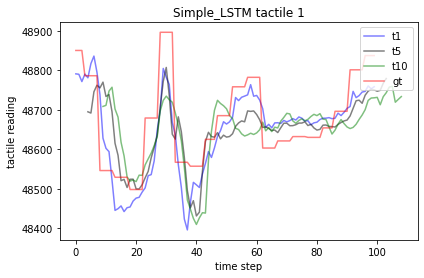

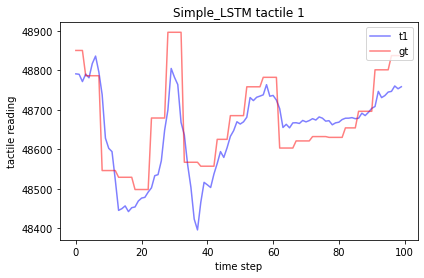

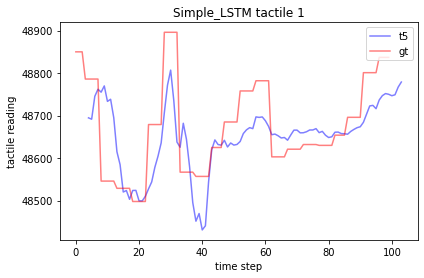

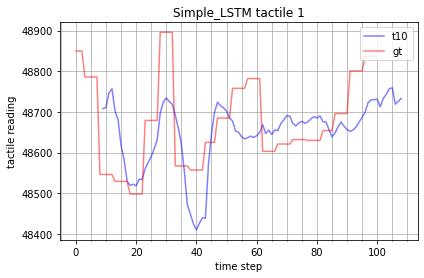

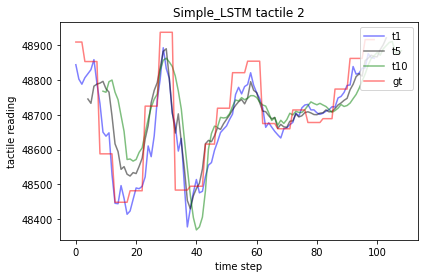

...

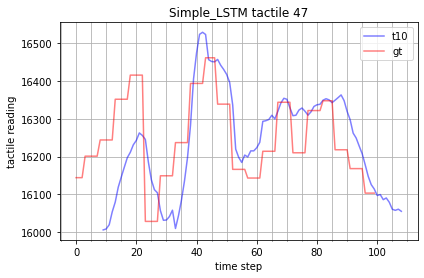

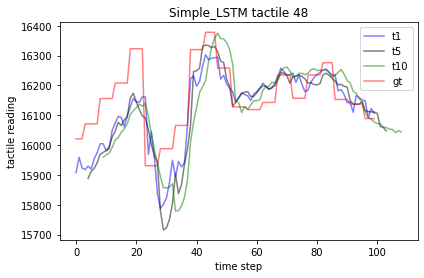

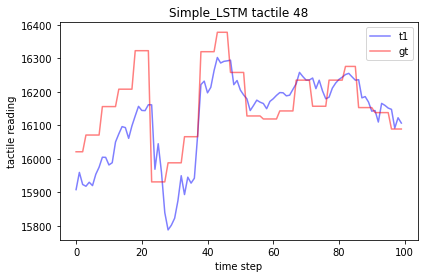

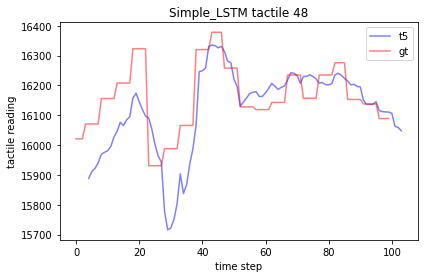

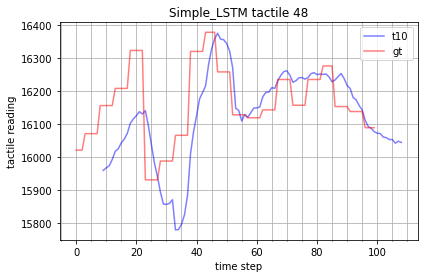

In [45]:
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
# calculate tactile values for full sample:
time_step_to_test_t1 = 0    # [batch_set, prediction frames(t1->tx)(6), batch_size, features(48)]
time_step_to_test_t5 = 4
time_step_to_test_t9 = 9
predicted_data_t1 = []
predicted_data_t5 = []
predicted_data_t9 = []
groundtruth_data = []
index_test = 0
experiment_to_test = len(p) - 1  # experiment 106 as its the last one
for index, batch_set in enumerate(tactile_predictions):
    for batch in range(0, len(batch_set[0])):
        experiment = experiment_time_steps[index][0][batch][0]
        if experiment == experiment_to_test:
            if not index_test == 0 : ## for use in single prediction plotting 
                single_prediction = batch_set
                single_ground_truth = tactile_groundtruth[index]
            prediction_values = batch_set[time_step_to_test_t1][batch]
            predicted_data_t1.append(prediction_values)
            prediction_values = batch_set[time_step_to_test_t5][batch]
            predicted_data_t5.append(prediction_values)
            prediction_values = batch_set[time_step_to_test_t9][batch]
            predicted_data_t9.append(prediction_values)
            gt_values = tactile_groundtruth[index][time_step_to_test_t1][batch]
            groundtruth_data.append(gt_values)
            index_test = 1
            
# plt.show()     
# mse_loss = torch.nn.MSELoss()
# mae_loss = torch.nn.L1Loss()

# test data
index = 0
experiment_to_test = 106
titles = ["sheerx", "sheery", "normal"]
for j in range(3):
    for i in range(16):
        groundtruth_taxle = []
        predicted_taxel = []
        predicted_taxel_t1 = []
        predicted_taxel_t5 = []
        predicted_taxel_t9 = []
        # good = 140, 145 (lifting up the )
        for k in range(320, 420):#len(predicted_data_t1)):#310, 325):#len(predicted_data_t1)):  # add in length of context data
            predicted_taxel_t1.append(predicted_data_t1[k][j+i].cpu().detach().numpy())
            predicted_taxel_t5.append(predicted_data_t5[k][j+i].cpu().detach().numpy())
            predicted_taxel_t9.append(predicted_data_t9[k][j+i].cpu().detach().numpy())
            groundtruth_taxle.append(groundtruth_data[k][j+i].cpu().detach().numpy())

        index += 1
        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([None for i in range(0)] + [i for i in predicted_taxel_t1], alpha=0.5, c="b", label="t1")
        ax1.plot([None for i in range(4)] + [i for i in predicted_taxel_t5], alpha=0.5, c="k", label="t5")
        ax1.plot([None for i in range(9)] + [i for i in predicted_taxel_t9], alpha=0.5, c="g", label="t10")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
        plt.title("Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_model_sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()

        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([None for i in range(0)] + [i for i in predicted_taxel_t1], alpha=0.5, c="b", label="t1")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
        plt.title("Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_model_T0sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()
        
        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([None for i in range(4)] + [i for i in predicted_taxel_t5], alpha=0.5, c="b", label="t5")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
        plt.title("Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_model_T5sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()
            
        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([None for i in range(9)] + [i for i in predicted_taxel_t9], alpha=0.5, c="b", label="t10")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")

        ax1.xaxis.set_minor_locator(AutoMinorLocator())
        ax1.tick_params(which='minor', length=1, color='k')
        ax1.grid(which='minor')
        ax1.grid(which='major')

        plt.title("Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_pca_model_T9sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()

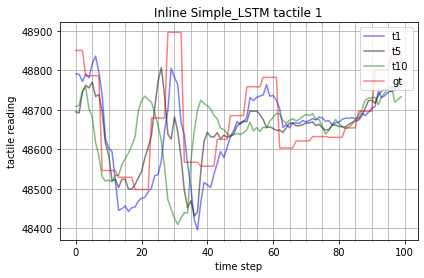

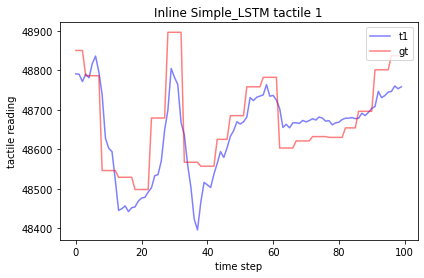

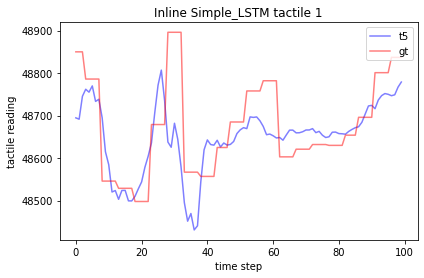

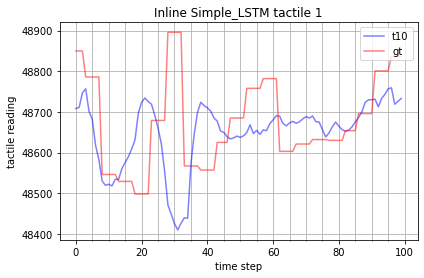

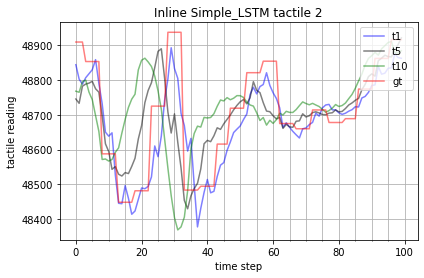

...

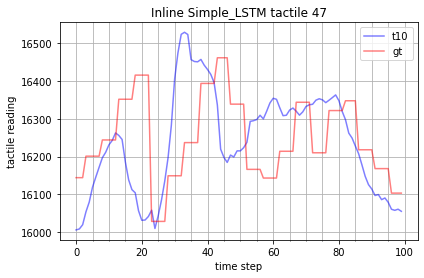

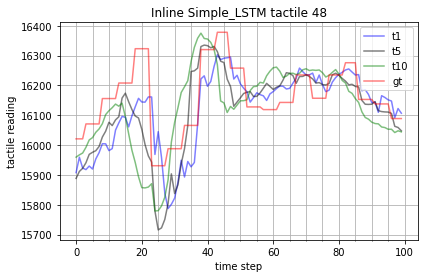

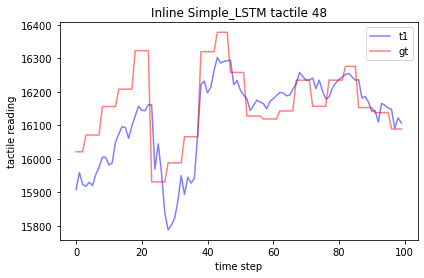

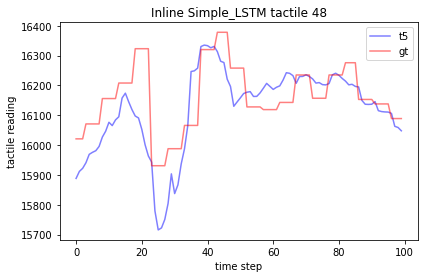

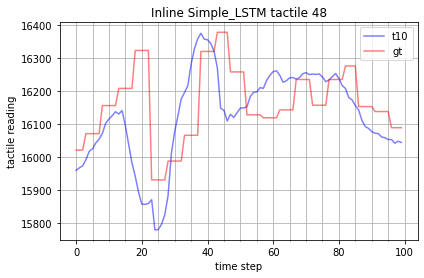

In [44]:
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
# calculate tactile values for full sample:
time_step_to_test_t1 = 0    # [batch_set, prediction frames(t1->tx)(6), batch_size, features(48)]
time_step_to_test_t5 = 4
time_step_to_test_t9 = 9
predicted_data_t1 = []
predicted_data_t5 = []
predicted_data_t9 = []
groundtruth_data = []
index_test = 0
experiment_to_test = len(p) - 1  # experiment 106 as its the last one
for index, batch_set in enumerate(tactile_predictions):
    for batch in range(0, len(batch_set[0])):
        experiment = experiment_time_steps[index][0][batch][0]
        if experiment == experiment_to_test:
            if not index_test == 0 : ## for use in single prediction plotting 
                single_prediction = batch_set
                single_ground_truth = tactile_groundtruth[index]
            prediction_values = batch_set[time_step_to_test_t1][batch]
            predicted_data_t1.append(prediction_values)
            prediction_values = batch_set[time_step_to_test_t5][batch]
            predicted_data_t5.append(prediction_values)
            prediction_values = batch_set[time_step_to_test_t9][batch]
            predicted_data_t9.append(prediction_values)
            gt_values = tactile_groundtruth[index][time_step_to_test_t1][batch]
            groundtruth_data.append(gt_values)
            index_test = 1

# test data
index = 0
experiment_to_test = 106
titles = ["sheerx", "sheery", "normal"]
for j in range(3):
    for i in range(16):
        groundtruth_taxle = []
        predicted_taxel = []
        predicted_taxel_t1 = []
        predicted_taxel_t5 = []
        predicted_taxel_t9 = []
        # good = 140, 145 (lifting up the )
        for k in range(320, 420):# len(predicted_data_t1)):#310, 325):#len(predicted_data_t1)):  # add in length of context data
            predicted_taxel_t1.append(predicted_data_t1[k][j+i].cpu().detach().numpy())
            predicted_taxel_t5.append(predicted_data_t5[k][j+i].cpu().detach().numpy())
            predicted_taxel_t9.append(predicted_data_t9[k][j+i].cpu().detach().numpy())
            groundtruth_taxle.append(groundtruth_data[k][j+i].cpu().detach().numpy())

        index += 1
        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([i for i in predicted_taxel_t1], alpha=0.5, c="b", label="t1")
        ax1.plot([i for i in predicted_taxel_t5], alpha=0.5, c="k", label="t5")
        ax1.plot([i for i in predicted_taxel_t9], alpha=0.5, c="g", label="t10")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
        
        ax1.xaxis.set_minor_locator(AutoMinorLocator())
        ax1.tick_params(which='minor', length=1, color='k')
        ax1.grid(which='minor')
        ax1.grid(which='major')
        
        plt.title("Inline Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_model_sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()

        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([i for i in predicted_taxel_t1], alpha=0.5, c="b", label="t1")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
        plt.title("Inline Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_model_T0sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()
        
        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([i for i in predicted_taxel_t5], alpha=0.5, c="b", label="t5")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
        plt.title("Inline Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_model_T5sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()
            
        fig, ax1 = plt.subplots()
        ax1.set_xlabel('time step')
        ax1.set_ylabel('tactile reading')
        ax1.plot([i for i in predicted_taxel_t9], alpha=0.5, c="b", label="t10")
        ax1.plot(groundtruth_taxle, alpha=0.5, c="r", label="gt")
        ax1.tick_params(axis='y')
        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.subplots_adjust(top=0.90)
        ax1.legend(loc="upper right")
            
        ax1.xaxis.set_minor_locator(AutoMinorLocator())
        ax1.tick_params(which='minor', length=1, color='k')
        ax1.grid(which='minor')
        ax1.grid(which='major')
        
        plt.title("Inline Simple_LSTM tactile " + str(index))
#         plt.savefig(model_path + '/' + str(experiment_to_test) + '/zeros_bigger_pconcat_double_data_pca_model_T9sample_test_with_loss_' + str(index) + '.png', dpi=300)
        plt.show()

torch.Size([10, 48])
torch.Size([10, 48])


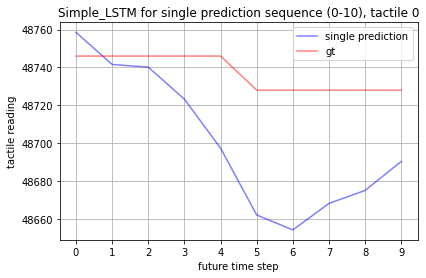

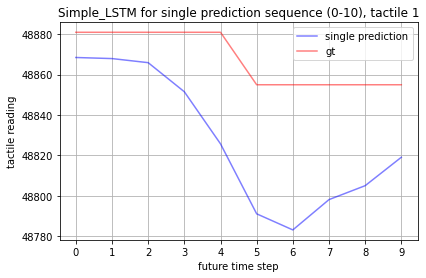

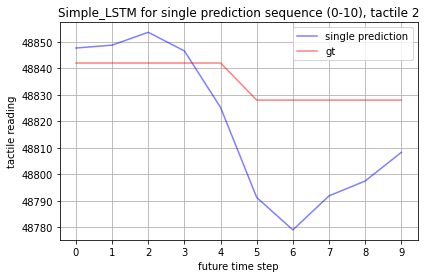

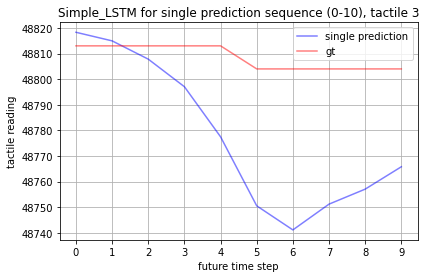

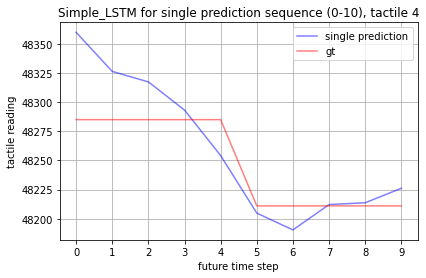

...

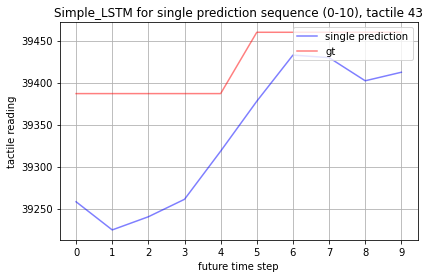

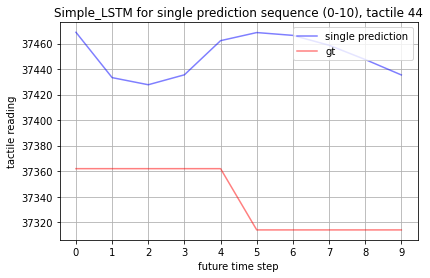

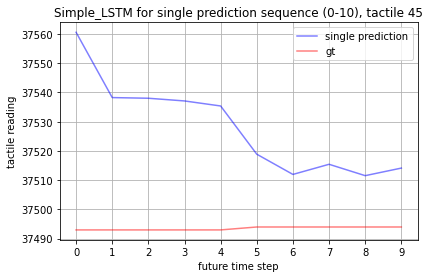

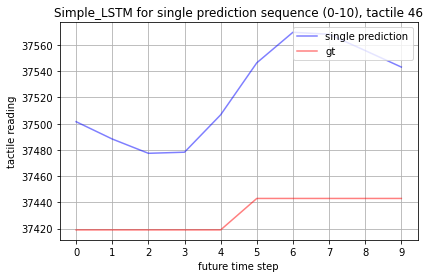

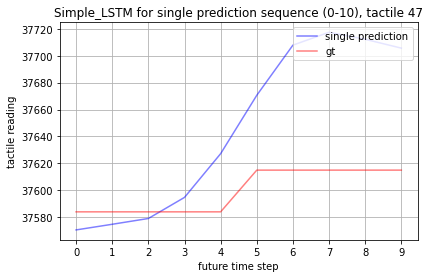

In [60]:
prediction = single_prediction[:,5,:]
ground_truth = single_ground_truth[:,5,:]

print(prediction.shape)
print(ground_truth.shape)

for i in range(48):
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('future time step')
    ax1.set_ylabel('tactile reading')
    ax1.plot(prediction[:,i].cpu().detach(), alpha=0.5, c="b", label="single prediction")
    ax1.plot(ground_truth[:,i].cpu().detach(), alpha=0.5, c="r", label="gt")
    ax1.tick_params(axis='y')
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    fig.subplots_adjust(top=0.90)
    ax1.legend(loc="upper right")
    ax1.xaxis.set_major_locator(MultipleLocator(1))
    ax1.grid(which='major')
#     plt.savefig(model_path + '/' + str(experiment_to_test) + '/pconcat_double_data_model_single_prediction_sample_' + str(i) + '.png', dpi=300)
    plt.title("Simple_LSTM for single prediction sequence (0-10), tactile " + str(i))
    plt.show()